# Remote Work vs Travel Data

In [9]:
# Imports:
import pprint, json, csv, os.path as path
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as st
import requests 
import hvplot.pandas
import numpy as np

In [10]:
allcrimedata = pd.read_csv("Resources/Crime_Data_from_2020_to_Present.csv")
allcrimedata

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
838896,231604807,01/27/2023 12:00:00 AM,01/26/2023 12:00:00 AM,1800,16,Foothill,1663,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,IC,Invest Cont,740.0,NaN,NaN,NaN,12500 BRANFORD ST,NaN,34.2466,-118.4054
838897,231606525,03/22/2023 12:00:00 AM,03/22/2023 12:00:00 AM,1000,16,Foothill,1602,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,IC,Invest Cont,230.0,NaN,NaN,NaN,12800 FILMORE ST,NaN,34.2790,-118.4116
838898,231210064,04/12/2023 12:00:00 AM,04/12/2023 12:00:00 AM,1630,12,77th Street,1239,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,IC,Invest Cont,230.0,NaN,NaN,NaN,6100 S VERMONT AV,NaN,33.9841,-118.2915
838899,230115220,07/02/2023 12:00:00 AM,07/01/2023 12:00:00 AM,1,1,Central,154,1,352,PICKPOCKET,...,IC,Invest Cont,352.0,NaN,NaN,NaN,500 S MAIN ST,NaN,34.0467,-118.2485


In [11]:
allcrimedata["DATE OCC"]=pd.to_datetime(allcrimedata["DATE OCC"])
allcrimedata["Date Rptd"]=pd.to_datetime(allcrimedata["Date Rptd"])
allcrimedata['Year Crime Occured'] = allcrimedata['DATE OCC'].dt.year
allcrimedata = allcrimedata[allcrimedata['Year Crime Occured'].between(2020,2022)]
#automatically dropped 2023 data
allcrimedata

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Year Crime Occured
0,10304468,2020-01-08,2020-01-08,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978,2020
1,190101086,2020-01-02,2020-01-01,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545,2020
2,200110444,2020-04-14,2020-02-13,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474,2020
3,191501505,2020-01-01,2020-01-01,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019,2020
4,191921269,2020-01-01,2020-01-01,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644198,221017286,2022-12-05,2022-12-01,1800,10,West Valley,1047,1,331,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,...,Invest Cont,331.0,NaN,NaN,NaN,17200 BURBANK BL,NaN,34.1722,-118.5077,2022
644199,221005507,2022-02-10,2022-02-09,1530,10,West Valley,1024,1,510,VEHICLE - STOLEN,...,Invest Cont,510.0,NaN,NaN,NaN,18800 SHERMAN WY,NaN,34.2011,-118.5426,2022
644200,221105477,2022-02-10,2022-02-08,2000,11,Northeast,1171,1,510,VEHICLE - STOLEN,...,Invest Cont,510.0,NaN,NaN,NaN,4000 FOUNTAIN AV,NaN,34.0958,-118.2787,2022
644201,221605448,2022-02-15,2022-02-14,1800,16,Foothill,1613,1,331,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,...,Invest Cont,331.0,NaN,NaN,NaN,12700 VAN NUYS BL,NaN,34.2755,-118.4092,2022


In [12]:
crime_data_2020 = allcrimedata.loc[(allcrimedata['DATE OCC'] >= '2020-01-01')
                     & (allcrimedata['DATE OCC'] < '2020-12-31')]
crime_data_2020

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Year Crime Occured
0,10304468,2020-01-08,2020-01-08,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978,2020
1,190101086,2020-01-02,2020-01-01,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545,2020
2,200110444,2020-04-14,2020-02-13,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474,2020
3,191501505,2020-01-01,2020-01-01,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019,2020
4,191921269,2020-01-01,2020-01-01,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199458,200318867,2020-10-14,2020-10-14,2130,3,Southwest,396,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,Adult Other,230.0,NaN,NaN,NaN,800 W MARTIN LUTHER KING JR BL,NaN,34.0111,-118.2872,2020
199459,230816743,2023-11-10,2020-09-13,2200,8,West LA,829,2,940,EXTORTION,...,Invest Cont,940.0,NaN,NaN,NaN,1700 COMSTOCK AV,NaN,34.0596,-118.4233,2020
199460,230916259,2023-11-11,2020-06-01,1200,9,Van Nuys,985,2,354,THEFT OF IDENTITY,...,Invest Cont,354.0,NaN,NaN,NaN,13900 MILBANK ST,NaN,34.1530,-118.4479,2020
199461,230123464,2023-11-06,2020-01-01,1220,1,Central,156,2,354,THEFT OF IDENTITY,...,Invest Cont,354.0,NaN,NaN,NaN,500 SAN JULIAN ST,NaN,34.0446,-118.2450,2020


In [13]:
crime_data_2020.to_csv("Resources/crime_data_2020")

In [14]:
crime_data_2021 = allcrimedata.loc[(allcrimedata['DATE OCC'] >= '2021-01-01')
                     & (allcrimedata['DATE OCC'] < '2021-12-31')]
crime_data_2021

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Year Crime Occured
119996,211911395,2021-07-28,2021-07-27,130,19,Mission,1982,2,890,FAILURE TO YIELD,...,Adult Arrest,890.0,NaN,NaN,NaN,RAYEN,COLUMBUS,34.2319,-118.4656,2021
121615,221307125,2022-03-01,2021-12-26,1300,13,Newton,1309,1,510,VEHICLE - STOLEN,...,Invest Cont,510.0,NaN,NaN,NaN,2200 E WASHINGTON BL,NaN,34.0194,-118.2340,2021
121865,210218766,2021-12-12,2021-12-11,2100,2,Rampart,257,1,510,VEHICLE - STOLEN,...,Invest Cont,510.0,NaN,NaN,NaN,1600 W 4TH ST,NaN,34.0592,-118.2675,2021
122145,212009618,2021-05-26,2021-05-25,2000,20,Olympic,2042,1,510,VEHICLE - STOLEN,...,Invest Cont,510.0,NaN,NaN,NaN,3600 W 9TH ST,NaN,34.0559,-118.3091,2021
122280,210205820,2021-02-16,2021-02-13,2000,2,Rampart,235,1,510,VEHICLE - STOLEN,...,Invest Cont,510.0,NaN,NaN,NaN,200 S CORONADO ST,NaN,34.0657,-118.2781,2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
408857,211421071,2021-11-07,2021-11-07,100,14,Pacific,1431,1,761,BRANDISH WEAPON,...,Invest Cont,761.0,NaN,NaN,NaN,00 WINDWARD AV,NaN,33.9873,-118.4729,2021
408858,210516671,2021-12-01,2021-12-01,1430,5,Harbor,585,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,Adult Other,740.0,NaN,NaN,NaN,1900 S GRAND AV,NaN,33.7270,-118.2902,2021
408859,210217231,2021-11-06,2021-11-05,2300,2,Rampart,235,1,510,VEHICLE - STOLEN,...,Invest Cont,510.0,NaN,NaN,NaN,2300 MIRAMAR ST,NaN,34.0649,-118.2741,2021
408860,210312887,2021-07-12,2021-07-12,1200,3,Southwest,363,1,350,"THEFT, PERSON",...,Invest Cont,350.0,NaN,NaN,NaN,CRENSHAW BL,STOCKER ST,34.0088,-118.3351,2021


In [15]:
crime_data_2021.to_csv("Resources/crime_data_2021")

In [16]:
crime_data_2022 = allcrimedata.loc[(allcrimedata['DATE OCC'] >= '2022-01-01')
                     & (allcrimedata['DATE OCC'] < '2022-12-31')]
crime_data_2022

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Year Crime Occured
408862,220216262,2022-09-08,2022-09-08,1445,2,Rampart,275,2,624,BATTERY - SIMPLE ASSAULT,...,Adult Other,624.0,NaN,NaN,NaN,1000 S BURLINGTON AV,NaN,34.0502,-118.2765,2022
408863,221809626,2022-04-23,2022-04-22,2100,18,Southeast,1862,1,510,VEHICLE - STOLEN,...,Invest Cont,510.0,NaN,NaN,NaN,SAN PEDRO ST,120TH ST,33.9237,-118.2696,2022
408864,221711121,2022-07-10,2022-07-10,200,17,Devonshire,1781,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,Invest Cont,230.0,NaN,NaN,NaN,8800 OSO AV,NaN,34.2299,-118.5754,2022
408865,220805283,2022-01-24,2022-01-22,1445,8,West LA,855,1,341,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",...,Invest Cont,341.0,NaN,NaN,NaN,1600 CAMDEN AV,NaN,34.0501,-118.4439,2022
408866,221821212,2022-11-27,2022-11-27,1635,18,Southeast,1826,1,210,ROBBERY,...,Invest Cont,210.0,NaN,NaN,NaN,91ST,COMPTON,33.9543,-118.2475,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644198,221017286,2022-12-05,2022-12-01,1800,10,West Valley,1047,1,331,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,...,Invest Cont,331.0,NaN,NaN,NaN,17200 BURBANK BL,NaN,34.1722,-118.5077,2022
644199,221005507,2022-02-10,2022-02-09,1530,10,West Valley,1024,1,510,VEHICLE - STOLEN,...,Invest Cont,510.0,NaN,NaN,NaN,18800 SHERMAN WY,NaN,34.2011,-118.5426,2022
644200,221105477,2022-02-10,2022-02-08,2000,11,Northeast,1171,1,510,VEHICLE - STOLEN,...,Invest Cont,510.0,NaN,NaN,NaN,4000 FOUNTAIN AV,NaN,34.0958,-118.2787,2022
644201,221605448,2022-02-15,2022-02-14,1800,16,Foothill,1613,1,331,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,...,Invest Cont,331.0,NaN,NaN,NaN,12700 VAN NUYS BL,NaN,34.2755,-118.4092,2022


In [17]:
crime_data_2022.to_csv("Resources/crime_data_2022")

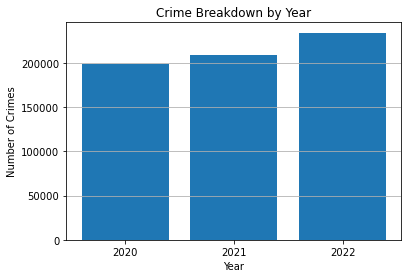

In [18]:
x = allcrimedata.groupby('Year Crime Occured',as_index=False).count()
y = x[['Year Crime Occured', 'DR_NO']].sort_values(by='Year Crime Occured')

plt.bar(x['Year Crime Occured'], y['DR_NO'])
plt.title("Crime Breakdown by Year")
plt.xlabel("Year")
plt.ylabel("Number of Crimes")
plt.xticks([2020, 2021, 2022])
plt.grid(axis='y')
plt.show()

In [19]:
crime_data_2020['Month Crime Occured'] = crime_data_2020['DATE OCC'].dt.month
crime2020 = crime_data_2020[crime_data_2020['Month Crime Occured'].between(1,12)]
crime2020

/var/folders/0q/zkrflw495bzdzwtp6bs457gh0000gn/T/ipykernel_2690/2864376885.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data_2020['Month Crime Occured'] = crime_data_2020['DATE OCC'].dt.month


,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Year Crime Occured,Month Crime Occured
0,10304468,2020-01-08,2020-01-08,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978,2020,1
1,190101086,2020-01-02,2020-01-01,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545,2020,1
2,200110444,2020-04-14,2020-02-13,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474,2020,2
3,191501505,2020-01-01,2020-01-01,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019,2020,1
4,191921269,2020-01-01,2020-01-01,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468,2020,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199458,200318867,2020-10-14,2020-10-14,2130,3,Southwest,396,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,230.0,NaN,NaN,NaN,800 W MARTIN LUTHER KING JR BL,NaN,34.0111,-118.2872,2020,10
199459,230816743,2023-11-10,2020-09-13,2200,8,West LA,829,2,940,EXTORTION,...,940.0,NaN,NaN,NaN,1700 COMSTOCK AV,NaN,34.0596,-118.4233,2020,9
199460,230916259,2023-11-11,2020-06-01,1200,9,Van Nuys,985,2,354,THEFT OF IDENTITY,...,354.0,NaN,NaN,NaN,13900 MILBANK ST,NaN,34.1530,-118.4479,2020,6
199461,230123464,2023-11-06,2020-01-01,1220,1,Central,156,2,354,THEFT OF IDENTITY,...,354.0,NaN,NaN,NaN,500 SAN JULIAN ST,NaN,34.0446,-118.2450,2020,1


In [20]:
crime_data_2021['Month Crime Occured'] = crime_data_2021['DATE OCC'].dt.month
crime2021 = crime_data_2021[crime_data_2021['Month Crime Occured'].between(1,12)]
crime2021

/var/folders/0q/zkrflw495bzdzwtp6bs457gh0000gn/T/ipykernel_2690/1751072156.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data_2021['Month Crime Occured'] = crime_data_2021['DATE OCC'].dt.month


,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Year Crime Occured,Month Crime Occured
119996,211911395,2021-07-28,2021-07-27,130,19,Mission,1982,2,890,FAILURE TO YIELD,...,890.0,NaN,NaN,NaN,RAYEN,COLUMBUS,34.2319,-118.4656,2021,7
121615,221307125,2022-03-01,2021-12-26,1300,13,Newton,1309,1,510,VEHICLE - STOLEN,...,510.0,NaN,NaN,NaN,2200 E WASHINGTON BL,NaN,34.0194,-118.2340,2021,12
121865,210218766,2021-12-12,2021-12-11,2100,2,Rampart,257,1,510,VEHICLE - STOLEN,...,510.0,NaN,NaN,NaN,1600 W 4TH ST,NaN,34.0592,-118.2675,2021,12
122145,212009618,2021-05-26,2021-05-25,2000,20,Olympic,2042,1,510,VEHICLE - STOLEN,...,510.0,NaN,NaN,NaN,3600 W 9TH ST,NaN,34.0559,-118.3091,2021,5
122280,210205820,2021-02-16,2021-02-13,2000,2,Rampart,235,1,510,VEHICLE - STOLEN,...,510.0,NaN,NaN,NaN,200 S CORONADO ST,NaN,34.0657,-118.2781,2021,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
408857,211421071,2021-11-07,2021-11-07,100,14,Pacific,1431,1,761,BRANDISH WEAPON,...,761.0,NaN,NaN,NaN,00 WINDWARD AV,NaN,33.9873,-118.4729,2021,11
408858,210516671,2021-12-01,2021-12-01,1430,5,Harbor,585,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,740.0,NaN,NaN,NaN,1900 S GRAND AV,NaN,33.7270,-118.2902,2021,12
408859,210217231,2021-11-06,2021-11-05,2300,2,Rampart,235,1,510,VEHICLE - STOLEN,...,510.0,NaN,NaN,NaN,2300 MIRAMAR ST,NaN,34.0649,-118.2741,2021,11
408860,210312887,2021-07-12,2021-07-12,1200,3,Southwest,363,1,350,"THEFT, PERSON",...,350.0,NaN,NaN,NaN,CRENSHAW BL,STOCKER ST,34.0088,-118.3351,2021,7


In [21]:
crime_data_2022['Month Crime Occured'] = crime_data_2022['DATE OCC'].dt.month
crime2022= crime_data_2022[crime_data_2022['Month Crime Occured'].between(1,12)]
crime2022

/var/folders/0q/zkrflw495bzdzwtp6bs457gh0000gn/T/ipykernel_2690/3406697961.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data_2022['Month Crime Occured'] = crime_data_2022['DATE OCC'].dt.month


,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Year Crime Occured,Month Crime Occured
408862,220216262,2022-09-08,2022-09-08,1445,2,Rampart,275,2,624,BATTERY - SIMPLE ASSAULT,...,624.0,NaN,NaN,NaN,1000 S BURLINGTON AV,NaN,34.0502,-118.2765,2022,9
408863,221809626,2022-04-23,2022-04-22,2100,18,Southeast,1862,1,510,VEHICLE - STOLEN,...,510.0,NaN,NaN,NaN,SAN PEDRO ST,120TH ST,33.9237,-118.2696,2022,4
408864,221711121,2022-07-10,2022-07-10,200,17,Devonshire,1781,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,230.0,NaN,NaN,NaN,8800 OSO AV,NaN,34.2299,-118.5754,2022,7
408865,220805283,2022-01-24,2022-01-22,1445,8,West LA,855,1,341,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",...,341.0,NaN,NaN,NaN,1600 CAMDEN AV,NaN,34.0501,-118.4439,2022,1
408866,221821212,2022-11-27,2022-11-27,1635,18,Southeast,1826,1,210,ROBBERY,...,210.0,NaN,NaN,NaN,91ST,COMPTON,33.9543,-118.2475,2022,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644198,221017286,2022-12-05,2022-12-01,1800,10,West Valley,1047,1,331,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,...,331.0,NaN,NaN,NaN,17200 BURBANK BL,NaN,34.1722,-118.5077,2022,12
644199,221005507,2022-02-10,2022-02-09,1530,10,West Valley,1024,1,510,VEHICLE - STOLEN,...,510.0,NaN,NaN,NaN,18800 SHERMAN WY,NaN,34.2011,-118.5426,2022,2
644200,221105477,2022-02-10,2022-02-08,2000,11,Northeast,1171,1,510,VEHICLE - STOLEN,...,510.0,NaN,NaN,NaN,4000 FOUNTAIN AV,NaN,34.0958,-118.2787,2022,2
644201,221605448,2022-02-15,2022-02-14,1800,16,Foothill,1613,1,331,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,...,331.0,NaN,NaN,NaN,12700 VAN NUYS BL,NaN,34.2755,-118.4092,2022,2


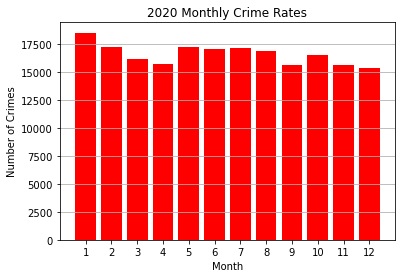

In [22]:
x = crime2020.groupby('Month Crime Occured',as_index=False).count()
y = x[['Month Crime Occured', 'DR_NO']].sort_values(by='Month Crime Occured')

plt.bar(x['Month Crime Occured'], y['DR_NO'], color='red')
plt.title("2020 Monthly Crime Rates")
plt.xlabel("Month")
plt.ylabel("Number of Crimes")
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12])
plt.grid(axis='y')
plt.show()

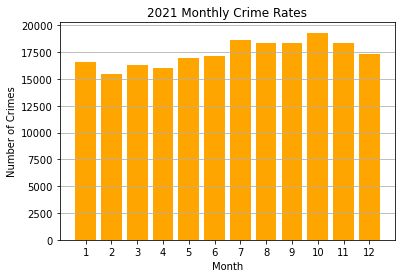

In [23]:
x = crime2021.groupby('Month Crime Occured',as_index=False).count()
y = x[['Month Crime Occured', 'DR_NO']].sort_values(by='Month Crime Occured')

plt.bar(x['Month Crime Occured'], y['DR_NO'], color='orange')
plt.title("2021 Monthly Crime Rates")
plt.xlabel("Month")
plt.ylabel("Number of Crimes")
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12])
plt.grid(axis='y')
plt.show()

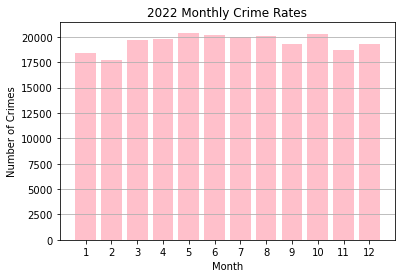

In [24]:
x = crime2022.groupby('Month Crime Occured',as_index=False).count()
y = x[['Month Crime Occured', 'DR_NO']].sort_values(by='Month Crime Occured')

plt.bar(x['Month Crime Occured'], y['DR_NO'], color='pink')
plt.title("2022 Monthly Crime Rates")
plt.xlabel("Month")
plt.ylabel("Number of Crimes")
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12])
plt.grid(axis='y')
plt.show()

In [109]:
area = crime2022.groupby('AREA NAME', as_index=False)
area = area[['AREA NAME']].value_counts()
area = area.sort_values('count', ascending=False)
area.head()

,AREA NAME,count
1,Central,17632
0,77th Street,14484
15,Southwest,13341
12,Pacific,12982
6,Hollywood,12482


In [26]:
crime2022 = crime2022.loc[crime2022["LAT"]!=0,:]

In [27]:
map_plot1 = crime2022.hvplot.points(
                                    "LON",
                                    "LAT",
                                    geo=True,
                                    tiles="CartoLight",
                                    frame_width=600,
                                    frame_height=500,
                                    color='AREA NAME'
                                    )
map_plot1

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LON,LAT]   (AREA NAME)

In [28]:
most_committed_crime_2022 = crime2022.groupby(['Crm Cd Desc'], as_index=False)
most_committed_crime_2022 = most_committed_crime_2022[['Crm Cd Desc']].value_counts()
most_committed_crime_2022 = most_committed_crime_2022.sort_values('count', ascending=False)
most_committed_crime_2022.head(10)

,Crm Cd Desc,count
128,VEHICLE - STOLEN,24647
113,THEFT OF IDENTITY,21768
4,BATTERY - SIMPLE ASSAULT,18012
20,BURGLARY FROM VEHICLE,14194
19,BURGLARY,14001
125,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",13303
2,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",12837
115,THEFT PLAIN - PETTY ($950 & UNDER),11324
71,INTIMATE PARTNER - SIMPLE ASSAULT,11121
110,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,10048


In [29]:
#pulling only ID Theft 2022
ID_theft2022 = crime2022.loc[crime2022["Crm Cd Desc"] == 'THEFT OF IDENTITY',:]
#seeing max and min age in data set
max_age = ID_theft2022['Vict Age'].max()
min_age= ID_theft2022['Vict Age'].min()
print(f"max age: {max_age}")
print(f"min age: {min_age}")
#seeing how many rows are age -1 to 0
age_zero = ID_theft2022.loc[ID_theft2022["Vict Age"] < 1,:]
print(len(age_zero))
#just want ages >1
ID_theft2022 = ID_theft2022.loc[ID_theft2022["Vict Age"] >1,:]

max age: 99
min age: -1
271


In [30]:
bins = [0, 29.9, 44.9, 64.9, 83.9, 99.9]
labels = ["0-30", "31-45", "46-65", "66-84", "85-100"]
ID_theft2022['ID Theft Victim Age'] = pd.cut(ID_theft2022['Vict Age'],bins, labels=labels,include_lowest=True)
ID_theft2022[["Crm Cd Desc",'Vict Age','ID Theft Victim Age']].head()

,Crm Cd Desc,Vict Age,ID Theft Victim Age
408871,THEFT OF IDENTITY,29,0-30
408884,THEFT OF IDENTITY,31,31-45
408897,THEFT OF IDENTITY,33,31-45
408901,THEFT OF IDENTITY,27,0-30
408904,THEFT OF IDENTITY,38,31-45


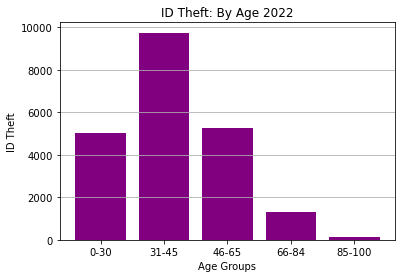

In [31]:
x = ID_theft2022.groupby('ID Theft Victim Age',as_index=False).count()
y = x[['ID Theft Victim Age', 'Vict Age']].sort_values(by='ID Theft Victim Age')

plt.bar(x['ID Theft Victim Age'], y['Vict Age'], color='purple')
plt.title("ID Theft: By Age 2022")
plt.xlabel("Age Groups")
plt.ylabel("ID Theft")
plt.xticks(labels)
plt.grid(axis='y')
plt.show()

In [32]:
#pulling only ID Theft 2020
ID_theft2020 = crime2020.loc[crime2020["Crm Cd Desc"] == 'THEFT OF IDENTITY',:]
#seeing max and min age in data set
max_age = ID_theft2020['Vict Age'].max()
min_age= ID_theft2020['Vict Age'].min()
print(f"max age: {max_age}")
print(f"min age: {min_age}")
#seeing how many rows are age -1 to 0
age_zero = ID_theft2020.loc[ID_theft2020["Vict Age"] < 1,:]
print(len(age_zero))
#just want ages >1
ID_theft2020 = ID_theft2020.loc[ID_theft2020["Vict Age"] >1,:]

max age: 99
min age: -2
161


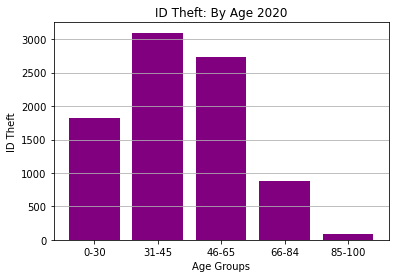

In [33]:
bins = [0, 29.9, 44.9, 64.9, 83.9, 99.9]
labels = ["0-30", "31-45", "46-65", "66-84", "85-100"]
ID_theft2020['ID Theft Victim Age'] = pd.cut(ID_theft2020['Vict Age'],bins, labels=labels,include_lowest=True)
x = ID_theft2020.groupby('ID Theft Victim Age',as_index=False).count()
y = x[['ID Theft Victim Age', 'Vict Age']].sort_values(by='ID Theft Victim Age')

plt.bar(x['ID Theft Victim Age'], y['Vict Age'], color='purple')
plt.title("ID Theft: By Age 2020")
plt.xlabel("Age Groups")
plt.ylabel("ID Theft")
plt.xticks(labels)
plt.grid(axis='y')
plt.show()

In [34]:
#pulling only ID Theft 2021
ID_theft2021 = crime2021.loc[crime2021["Crm Cd Desc"] == 'THEFT OF IDENTITY',:]
#seeing max and min age in data set
max_age = ID_theft2021['Vict Age'].max()
min_age= ID_theft2021['Vict Age'].min()
print(f"max age: {max_age}")
print(f"min age: {min_age}")
#seeing how many rows are age -1 to 0
age_zero = ID_theft2021.loc[ID_theft2021["Vict Age"] < 1,:]
print(len(age_zero))
#just want ages >1
ID_theft2021 = ID_theft2021.loc[ID_theft2021["Vict Age"] >1,:]

max age: 99
min age: -1
293


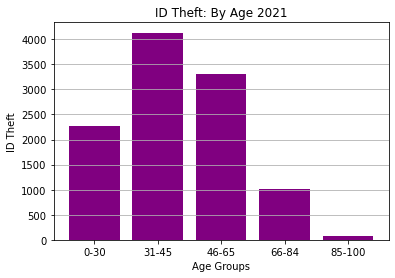

In [35]:
bins = [0, 29.9, 44.9, 64.9, 83.9, 99.9]
labels = ["0-30", "31-45", "46-65", "66-84", "85-100"]
ID_theft2021['ID Theft Victim Age'] = pd.cut(ID_theft2021['Vict Age'],bins, labels=labels,include_lowest=True)
x = ID_theft2021.groupby('ID Theft Victim Age',as_index=False).count()
y = x[['ID Theft Victim Age', 'Vict Age']].sort_values(by='ID Theft Victim Age')

plt.bar(x['ID Theft Victim Age'], y['Vict Age'], color='purple')
plt.title("ID Theft: By Age 2021")
plt.xlabel("Age Groups")
plt.ylabel("ID Theft")
plt.xticks(labels)
plt.grid(axis='y')
plt.show()

43.48299082781841
41.0
ModeResult(mode=array([32]), count=array([256]))


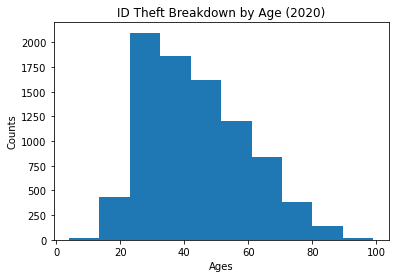

NormaltestResult(statistic=436.68118231027546, pvalue=1.499291524148051e-95)


In [36]:
age2020 = ID_theft2020['Vict Age']
mean_numpy = np.mean(age2020)
median_numpy = np.median(age2020)
mode_scipy = st.mode(age2020)
print(mean_numpy)
print(median_numpy)
print(mode_scipy)
plt.hist(age2020)
plt.title('ID Theft Breakdown by Age (2020)')
plt.xlabel('Ages')
plt.ylabel('Counts')
plt.show()
print(st.normaltest(age2020))

42.967917899408285
40.0
ModeResult(mode=array([32]), count=array([328]))


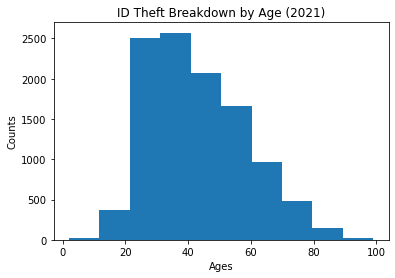

NormaltestResult(statistic=571.0842007068957, pvalue=9.78681694922799e-125)


In [37]:
age2021=ID_theft2021['Vict Age']
mean_numpy = np.mean(age2021)
median_numpy = np.median(age2021)
mode_scipy = st.mode(age2021)
print(mean_numpy)
print(median_numpy)
print(mode_scipy)
plt.hist(age2021)
plt.title('ID Theft Breakdown by Age (2021)')
plt.xlabel('Ages')
plt.ylabel('Counts')
plt.show()
print(st.normaltest(age2021))

40.29357584779272
37.0
ModeResult(mode=array([30]), count=array([821]))


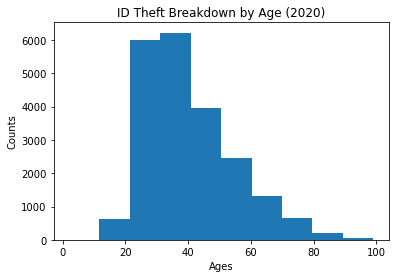

NormaltestResult(statistic=2515.5122455432224, pvalue=0.0)


In [38]:
age2022=ID_theft2022['Vict Age']
mean_numpy = np.mean(age2022)
median_numpy = np.median(age2022)
mode_scipy = st.mode(age2022)
print(mean_numpy)
print(median_numpy)
print(mode_scipy)
plt.hist(age2022)
plt.title('ID Theft Breakdown by Age (2020)')
plt.xlabel('Ages')
plt.ylabel('Counts')
plt.show()
print(st.normaltest(age2022))

In [136]:
ID_theft2022.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Year Crime Occured,Month Crime Occured,ID Theft Victim Age
408871,221206904,2022-02-23,2022-02-17,1800,12,77th Street,1241,2,354,THEFT OF IDENTITY,...,NaN,NaN,NaN,6300 11TH AV,NaN,33.9829,-118.3294,2022,2,0-30
408884,220413082,2022-09-12,2022-09-03,105,4,Hollenbeck,457,2,354,THEFT OF IDENTITY,...,NaN,NaN,NaN,500 N MOTT ST,NaN,34.0469,-118.2029,2022,9,31-45
408897,221815052,2022-08-01,2022-07-06,2206,18,Southeast,1844,2,354,THEFT OF IDENTITY,...,NaN,NaN,NaN,10800 S SAN PEDRO ST,NaN,33.9383,-118.2695,2022,7,31-45
408901,220515520,2022-11-01,2022-11-01,600,5,Harbor,516,2,354,THEFT OF IDENTITY,...,NaN,NaN,NaN,1000 N AVALON BL,NaN,33.7868,-118.2658,2022,11,0-30
408904,221320560,2022-11-07,2022-11-05,638,13,Newton,1331,2,354,THEFT OF IDENTITY,...,NaN,NaN,NaN,2700 S GRAND AV,NaN,34.0254,-118.2729,2022,11,31-45


# ID Theft by Area per Year

In [137]:
area2020 = ID_theft2020.groupby('AREA NAME', as_index=False)
area2020 = area2020[['AREA NAME']].value_counts()
area2020 = area2020.sort_values('count', ascending=False)
area2020.head()

,AREA NAME,count
18,West LA,651
17,Van Nuys,588
2,Devonshire,587
8,N Hollywood,572
16,Topanga,557


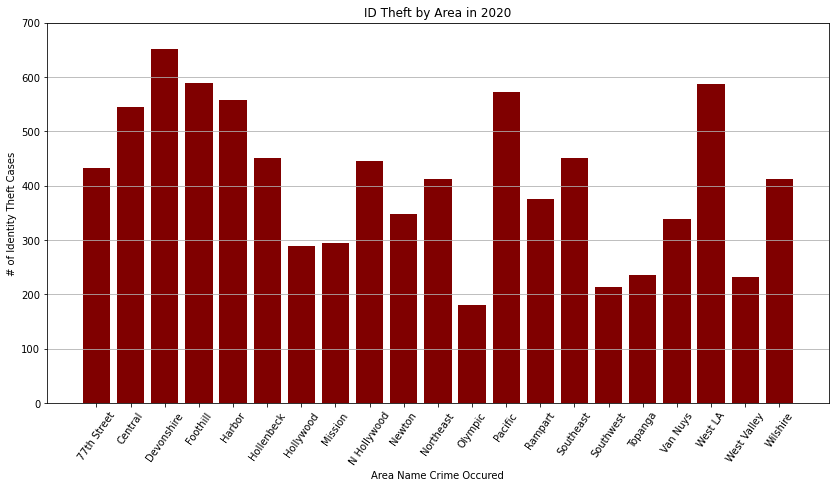

In [159]:
area2020_x = area2020['AREA NAME'].sort_values(ascending=True)
area2020_count = area2020.sort_values('AREA NAME', ascending=False)
area2020_y = area2020_count['count']

plt.figure(figsize = (14,7))
plt.bar(area2020_x,area2020_y, color="maroon")
plt.grid(axis='y')
plt.xticks(rotation=55)
plt.ylim(0,700)
plt.title("ID Theft by Area in 2020")
plt.xlabel("Area Name Crime Occured")
plt.ylabel("# of Identity Theft Cases")
plt.show()

In [160]:
area2021 = ID_theft2021.groupby('AREA NAME', as_index=False)
area2021 = area2021[['AREA NAME']].value_counts()
area2021 = area2021.sort_values('count', ascending=False)
area2021.head()

,AREA NAME,count
18,West LA,715
16,Topanga,710
19,West Valley,667
17,Van Nuys,652
2,Devonshire,648


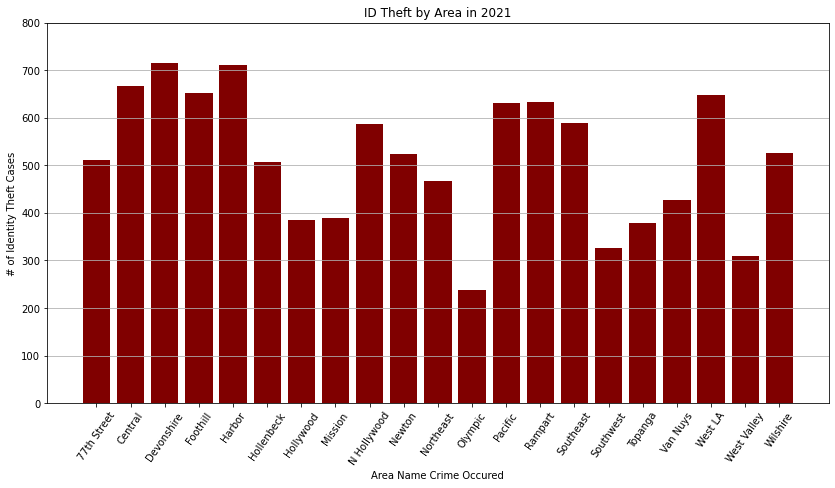

In [161]:
area2021_x = area2021['AREA NAME'].sort_values(ascending=True)
area2021_count = area2021.sort_values('AREA NAME', ascending=False)
area2021_y = area2021_count['count']

plt.figure(figsize = (14,7))
plt.bar(area2021_x,area2021_y,color="maroon")
plt.grid(axis='y')
plt.xticks(rotation=55)
plt.ylim(0,800)
plt.title("ID Theft by Area in 2021")
plt.xlabel("Area Name Crime Occured")
plt.ylabel("# of Identity Theft Cases")
plt.show()

In [162]:
area2022 = ID_theft2022.groupby('AREA NAME', as_index=False)
area2022 = area2022[['AREA NAME']].value_counts()
area2022 = area2022.sort_values('count', ascending=False)
area2022.head()

,AREA NAME,count
0,77th Street,2016
14,Southeast,1779
15,Southwest,1663
9,Newton,1291
13,Rampart,1179


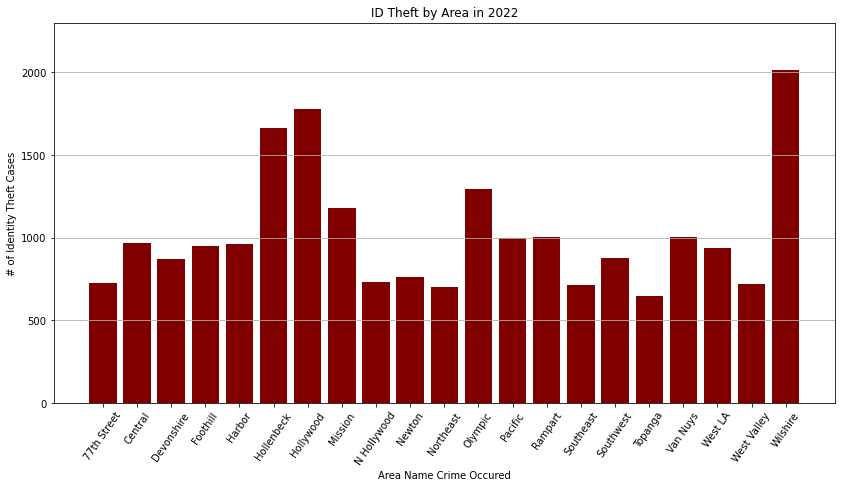

In [163]:
area2022_x = area2022['AREA NAME'].sort_values(ascending=True)
area2022_count = area2022.sort_values('AREA NAME', ascending=False)
area2022_y = area2022_count['count']

plt.figure(figsize = (14,7))
plt.bar(area2022_x,area2022_y,color="maroon")
plt.grid(axis='y')
plt.xticks(rotation=55)
plt.ylim(0,2300)
plt.title("ID Theft by Area in 2022")
plt.xlabel("Area Name Crime Occured")
plt.ylabel("# of Identity Theft Cases")
plt.show()

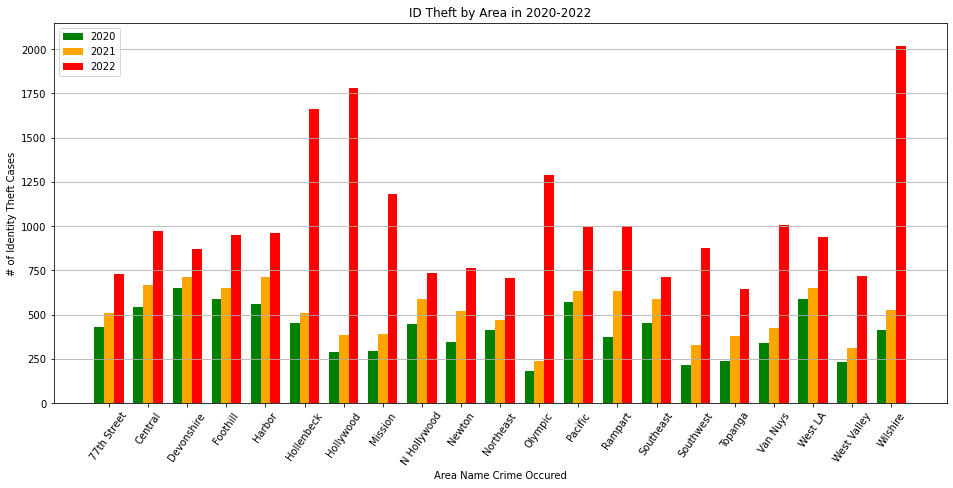

<Figure size 432x288 with 0 Axes>

In [196]:
plt.figure(figsize = (16,7))
x_axis = np.arange(len(area2020_x))
plt.bar(x_axis - 0.25, area2020_y, 0.25, color="green", label="2020")
bar1 = plt.bar(x_axis, area2021_y, 0.25, color="orange", label="2021")
bar2 = plt.bar(x_axis + 0.25, area2022_y, 0.25, color="red", label="2022")
bar3 = plt.grid(axis='y')
plt.xticks(x_axis, area2020_x ,rotation=55)
plt.ylim(0,2150)
plt.title("ID Theft by Area in 2020-2022")
plt.xlabel("Area Name Crime Occured")
plt.ylabel("# of Identity Theft Cases")
plt.legend()
plt.show()

plt.savefig("Output/ID_Theft_Yearly_By_Area_BarGraph")